# detect swr 

### with ripple detection from:

https://github.com/Eden-Kramer-Lab/ripple_detection

## import packages

In [317]:
# data managment and math functions
import pandas as pd
import numpy as np
import math

import time

# import neuroseries as nts

# plotting
from matplotlib import pyplot as plt

# scipy
import scipy.io
import scipy.signal
from scipy import stats
from scipy.signal import hilbert
from scipy.ndimage import gaussian_filter1d

# for loading files
import h5py
import sys,os
import glob
import pickle

# parallel processing
import multiprocessing
from joblib import Parallel, delayed

# ripple detector
from ripple_detection import Kay_ripple_detector, Karlsson_ripple_detector, filter_ripple_band, Roumis_ripple_detector

# Continuous Wavelet Transform
import obspy
from obspy.imaging.cm import obspy_sequential
from obspy.signal.tf_misfit import cwt

## set up plotting defaults

In [2]:
plt.style.use('dark_background')

params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}
plt.rcParams.update(params)

plt.rcParams.update({'font.size': 13})
%config InlineBackend.figure_format = 'retina'

In [316]:
def loadXML(path):
    """
    path should be the folder session containing the XML file
    Function returns :
        1. the number of channels
        2. the sampling frequency of the dat file or the eeg file depending of what is present in the folder
            eeg file first if both are present or both are absent
        3. the mappings shanks to channels as a dict
    Args:
        path : string
    Returns:
        int, int, dict
    """
    if not os.path.exists(path):
        print("The path "+path+" doesn't exist; Exiting ...")
        sys.exit()
    listdir = os.listdir(path)
    xmlfiles = [f for f in listdir if f.endswith('.xml')]
    if not len(xmlfiles):
        print("Folder contains no xml files; Exiting ...")
        sys.exit()
    new_path = os.path.join(path, xmlfiles[0])

    from xml.dom import minidom	
    xmldoc = minidom.parse(new_path)
    nChannels = xmldoc.getElementsByTagName('acquisitionSystem')[0].getElementsByTagName('nChannels')[0].firstChild.data
    fs_dat = xmldoc.getElementsByTagName('acquisitionSystem')[0].getElementsByTagName('samplingRate')[0].firstChild.data
    fs = xmldoc.getElementsByTagName('fieldPotentials')[0].getElementsByTagName('lfpSamplingRate')[0].firstChild.data

    shank_to_channel = {}
    groups = xmldoc.getElementsByTagName('anatomicalDescription')[0].getElementsByTagName('channelGroups')[0].getElementsByTagName('group')
    for i in range(len(groups)):
        shank_to_channel[i] = np.sort([int(child.firstChild.data) for child in groups[i].getElementsByTagName('channel')])
    return int(nChannels), int(fs), shank_to_channel

def loadLFP(path, n_channels=90, channel=64, frequency=1250.0, precision='int16'):
    if type(channel) is not list:
        f = open(path, 'rb')
        startoffile = f.seek(0, 0)
        endoffile = f.seek(0, 2)
        bytes_size = 2
        n_samples = int((endoffile-startoffile)/n_channels/bytes_size)
        duration = n_samples/frequency
        interval = 1/frequency
        f.close()
        with open(path, 'rb') as f:
            data = np.fromfile(f, np.int16).reshape((n_samples, n_channels))[:,channel]
            timestep = np.arange(0, len(data))/frequency
            return data, timestep # nts.Tsd(timestep, data, time_units = 's')
        
    elif type(channel) is list:
        f = open(path, 'rb')
        startoffile = f.seek(0, 0)
        endoffile = f.seek(0, 2)
        bytes_size = 2

        n_samples = int((endoffile-startoffile)/n_channels/bytes_size)
        duration = n_samples/frequency
        f.close()
        with open(path, 'rb') as f:
            data = np.fromfile(f, np.int16).reshape((n_samples, n_channels))[:,channel]
            timestep = np.arange(0, len(data))/frequency
            return data,timestep # nts.TsdFrame(timestep, data, time_units = 's')
        
def load_lfp(file,channels,fs):
    LFP = []
    for i in range(channels):
        lfp,ts = loadLFP(file, n_channels=channels, channel=i, frequency=fs)
        LFP.append(lfp)

    lfp = np.vstack(LFP)  
    return lfp.T, ts

def load_position(session):
    f = h5py.File(session,'r')
    # load frames [ts x y a s] 
    frames = np.transpose(np.array(f['frames']))
    return pd.DataFrame(frames,columns=['ts', 'x', 'y', 'hd', 'speed'])    

def get_ripple_channel(ripple_times,filtered_lfps,ts):
    channel = []
    peak_amplitude = []

    for ripple in ripple_times.itertuples():
        idx = np.logical_and(ts >= ripple.start_time, ts <= ripple.end_time)
        peaks = np.max(filtered_lfps[idx,:],axis = 0)
        peak_idx = np.argmax(peaks)

        peak_amplitude.append(peaks[peak_idx])
        channel.append(peak_idx)

    ripple_times['peak_channel'] = channel
    ripple_times['peak_amplitude'] = peak_amplitude
    return ripple_times

def get_phase_amp_freq(sig,fs):
    
    phas = []
    amp = []
    freq = []
    
    for signal in sig.T:
        analytic_signal = hilbert(signal)
        amplitude_envelope = np.abs(analytic_signal)
        phase = np.angle(analytic_signal)
        instantaneous_phase = np.unwrap(phase)
        instantaneous_frequency = gaussian_filter1d((np.diff(instantaneous_phase) / (2.0*np.pi) * fs),
                                                    0.004 * fs, truncate=8, axis=0,mode='constant')
        phas.append(phase)
        amp.append(amplitude_envelope)
        freq.append(instantaneous_frequency)
    
    phas = np.vstack(phas) 
    amp = np.vstack(amp)
    freq = np.vstack(freq) 

    return phas.T,amp.T,freq.T

def get_ripple_freq(ripple_times,freq,dt):
    peak_freq = []
    for ripple in ripple_times.itertuples():
        idx = np.logical_and(dt >= ripple.start_time, dt <= ripple.end_time)
        rip = freq[idx,ripple.peak_channel]
        peak_freq.append(rip[len(rip) // 2])
    ripple_times['peak_freq'] = peak_freq
    return ripple_times

def get_ripple_freq_peaks_method(ripple_times,filtered_lfps,ts,fs,peak_dist=0.0032):
    fqcy = np.zeros((len(ripple_times),1))
    i = 0
    for ripple in ripple_times.itertuples():
        idx = np.logical_and(ts >= ripple.start_time, ts <= ripple.end_time)
        rip = filtered_lfps[idx,ripple.peak_channel]
        # find peaks with a distance of 3.2 ms
        peakIx = scipy.signal.find_peaks(x = -rip, distance = peak_dist//(1/fs), threshold = 0.0)
        peakIx = peakIx[0]
        if (not (peakIx.size == 0)) and (peakIx.size != 1):
            fqcy[i] = fs/np.median(np.diff(peakIx))
        else:
            print("This is something weird now...")
        i += 1
    ripple_times['peak_freq'] = fqcy
    return ripple_times
    
def get_session_path(session):
    f = h5py.File(session,'r')
    return f['session_path'][()].tobytes()[::2].decode()

def get_ripple_maps(ripple_times,ts,lfp,filtered_lfps,phase,amp,freq):
    
    # Initializing variables
    rip = np.zeros((len(ripple_times),151))
    rip_filt = np.zeros((len(ripple_times),151))
    rip_phase = np.zeros((len(ripple_times),151))
    rip_amp = np.zeros((len(ripple_times),151))
    rip_freq = np.zeros((len(ripple_times),151))

    # row index
    ind = np.arange(0,len(lfp),1) 

    i = 0
    for ripple in ripple_times.itertuples():
        # get ripple index
        idx = np.logical_and(ts >= ripple.start_time, ts <= ripple.end_time)
        # find middle point
        middle_idx = len(ind[idx]) // 2
        # find that middle points index in the row index
        middle_idn = ind[idx][middle_idx]
        # create expanded index
        idx = np.arange(middle_idn - 75,middle_idn + 76,1)
        
        # if ripple is the the very beginning or end of session
        if (middle_idn - 75 < 0) or (middle_idn + 76 > len(ind)):
            x = np.zeros(151)
            rip[i] = x
            rip_filt[i] = x
            rip_phase[i] = x
            rip_amp[i] = x
            rip_freq[i] = x
            print('ripple close to edge of session')
        else:
            # pull out expanded index
            rip[i] = lfp[idx,ripple.peak_channel]
            rip_filt[i] = filtered_lfps[idx,ripple.peak_channel]
            rip_phase[i] = phase[idx,ripple.peak_channel]
            rip_amp[i] = amp[idx,ripple.peak_channel]
            rip_freq[i] = freq[idx,ripple.peak_channel]

            i+=1
        
    ripple_maps = {"ripple_map": rip,
            "filtered_map":rip_filt,
            "phase_map":rip_phase,
           "amp_map":rip_amp,
           "freq_map":rip_freq}
    
    return ripple_maps

def normalize(list, range):
    l = np.array(list) 
    a = np.max(l)
    c = np.min(l)
    b = range[1]
    d = range[0]
    m = (b - d) / (a - c)
    pslope = (m * (l - c)) + d
    return pslope

def get_scalogram(sig,fs,padding=100,f_min=150,f_max=250,fig=1,ax=0):
    
    # sample difference
    dt = 1/fs
    # pad signal
    sig_padded = np.pad(sig, (padding, padding), 'linear_ramp')
    # get time stamps
    t = np.linspace(0, dt * len(sig), len(sig))
    # get scalogram
    scalogram = cwt(sig_padded, dt, 8, f_min, f_max)
    # delete padding
    scalogram = np.delete(scalogram, np.s_[1:padding+1], axis=1) 
    scalogram = np.delete(scalogram, np.s_[-(padding+1):-1], axis=1) 
    
    # plot figure
    if fig==1:
        if ax == 0:
            fig = plt.figure()
            ax = fig.add_subplot(111)

        x, y = np.meshgrid(
            t,
            np.logspace(np.log10(f_min), np.log10(f_max), scalogram.shape[0]))

        ax.pcolormesh(x, y, np.abs(scalogram), cmap=obspy_sequential,shading='auto')
        ax.plot(t,normalize(sig,[f_min,f_max]),'k',linewidth=1)
        ax.set_ylabel("Frequency [Hz]")
        ax.set_ylim(f_min, f_max)
        # ax.set_yscale('log')
        if ax == 0:
            plt.show()
    
    return np.abs(scalogram)

In [4]:
def run_all(session):
    
    # get data session path from mat file
    path = get_session_path(session)
    
    # load position data from .mat file
    df = load_position(session)
    
    # load xml which has channel & fs info
    channels,fs,shank = loadXML(path)
    
    # load .lfp
    lfp, ts = load_lfp(glob.glob(path +'\*.lfp')[0],channels,fs)
    
    # interp speed of the animal
    speed = np.interp(ts,df.ts,df.speed)
    speed[np.isnan(speed)] = 0
    
    # filter out potential noise epochs (> 2.5 std)
#     zscore_sig = stats.zscore(lfp)
#     idx = abs(zscore_sig) > 3
#     lfp_temp = np.array(lfp, dtype=np.float64)
#     lfp_temp[idx] = np.nan
    
    # detect ripples
    ripple_times = Karlsson_ripple_detector(ts, lfp, speed, fs,                       
                            speed_threshold=3.0, minimum_duration=0.02,
                            zscore_threshold=3.0, smoothing_sigma=0.004,
                            close_ripple_threshold=0.0)
    
    # restrict ripples to < 150 ms
    ripple_times['ripple_duration'] = ripple_times.end_time - ripple_times.start_time
    ripple_times = ripple_times[ripple_times.ripple_duration < 0.150]
    
    # extend window to 150 ms
    offset = (0.150 - ripple_times.ripple_duration) / 2
    ripple_times['start_time_extended'] = ripple_times.start_time - offset
    ripple_times['end_time_extended'] = ripple_times.end_time + offset
    
    # get filtered signal
    LFPs = lfp
    filtered_lfps = np.stack([filter_ripple_band(lfp, fs) for lfp in LFPs.T])
    filtered_lfps = filtered_lfps.T
    
    # add ripple channel and peak amp
    ripple_times = get_ripple_channel(ripple_times,filtered_lfps,ts)
    
#     start_time = time.time()
#     ripple_times = get_ripple_freq_peaks_method(ripple_times,filtered_lfps,ts,fs)
#     print("get_ripple_freq--- %s seconds ---" % (time.time() - start_time))

    # get instant phase, amp, and freq
    phase,amp,freq = get_phase_amp_freq(filtered_lfps,fs)
    dt = ts[:-1] + (1/fs)/2 # derivative ts
    
    # get ripple frequency
    ripple_times = get_ripple_freq(ripple_times,freq,dt)
    
    # get ripple_map
    ripple_maps = get_ripple_maps(ripple_times,ts,lfp,filtered_lfps,phase,amp,freq)
    
    return ripple_times,lfp,filtered_lfps,ts,ripple_maps

## Loop through ever session

In [5]:
data_path = 'F:\\Projects\\PAE_PlaceCell\\ProcessedData\\'
save_path = "F:\\Projects\\PAE_PlaceCell\\swr_data\\"
sessions = glob.glob(data_path + '*.mat')

# i = 0
# n_sessions = len(sessions)

# for session in sessions:
    
#     # update counter
#     sys.stdout.write('\rcurrent cell: %d' %(n_sessions - i))
#     sys.stdout.flush()
#     i+=1
    
#     base = os.path.basename(session)
#     os.path.splitext(base)
#     save_file = save_path + os.path.splitext(base)[0] + '.pkl'
                 
#     # check if saved file exists
#     if os.path.exists(save_file):
#         continue
                 
#     # detect ripples and calc some features
#     ripple_times,lfp,filtered_lfps,ts,ripple_maps = run_all(session)   

#     # save file
#     with open(save_file, 'wb') as f:
#         pickle.dump(ripple_times, f)
#         pickle.dump(ripple_maps, f)
        
def main_loop(session,data_path,save_path):
    base = os.path.basename(session)
    os.path.splitext(base)
    save_file = save_path + os.path.splitext(base)[0] + '.pkl'
    
    # check if saved file exists
    if os.path.exists(save_file):
        return
        
    # detect ripples and calc some features
    ripple_times,lfp,filtered_lfps,ts,ripple_maps = run_all(session)   

    # save file
    with open(save_file, 'wb') as f:
        pickle.dump(ripple_times, f)
        pickle.dump(ripple_maps, f)

for session in sessions:
    print(session)
    main_loop(session,data_path,save_path)
    
# num_cores = multiprocessing.cpu_count()                             
# processed_list = Parallel(n_jobs=num_cores)(delayed(main_loop)(session,data_path,save_path) for session in sessions)


F:\Projects\PAE_PlaceCell\ProcessedData\LE2813_S20170920115122.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LE2821_S20171012114532.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LE2821_S20171023141225.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LE2821_S20171026105920.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LE2823_S20171204142319.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180713111238.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180715121821.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180715160836.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180716115155.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180716174306.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180717110938.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180717203042.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180718160658.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S20180718184628.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3116_S2018

ripple close to edge of session
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3216_S20190823135619.mat
ripple close to edge of session
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3216_S20190911132239.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190629164240.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190701153855.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190702103544.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190703165826.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190706150556.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190708191502.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190709143146.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190710150227.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190712170007.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190714113704.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S20190715190235.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LEM3246_S201

ripple close to edge of session
ripple close to edge of session
F:\Projects\PAE_PlaceCell\ProcessedData\LS21_S20170403123111.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS21_S20170410110923.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170220105022.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170223141840.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170224155244.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170228130918.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170301110430.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170303113655.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170306111147.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170307134239.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170316172905.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170327135410.mat
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S20170403151118.mat
ripple close to edge of session
F:\Projects\PAE_PlaceCell\ProcessedData\LS23_S2017040421511

F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160627105632.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160627150000.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160627152213.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160627154744.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160629160000.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160629161540.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160629165057.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160714101052.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160720120513.mat
ripple close to edge of session
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160720121543.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160729103946.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160729110319.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160806122347.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH11_S20160806123442.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH13_S201606221343

F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160627110000.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160627112629.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160627115816.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160630125427.mat
ripple close to edge of session
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160714110000.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160714110339.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160714113031.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160719115322.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160729110000.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160729114800.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160729123438.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160805152216.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160805153408.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S20160807140000.mat
F:\Projects\PAE_PlaceCell\ProcessedData\RH14_S201608071412

## load data back in

In [109]:
save_path = "F:\\Projects\\PAE_PlaceCell\\swr_data\\"
sessions = glob.glob(save_path + '*.pkl')
ripple_maps = []
i = 0
for session in sessions:
    with open(session, 'rb') as f:
        ripple_times = pickle.load(f)
        ripple_map = pickle.load(f)
    ripple_maps.append(ripple_map["ripple_map"])
    if i == 0:
        frames = ripple_times
    else:
        frames = [frames,ripple_times]

result = pd.concat(frames)

ripple_maps = np.vstack(ripple_maps)     
ripple_maps  

TypeError: first argument must be an iterable of pandas objects, you passed an object of type "DataFrame"

In [8]:
ripple_maps.shape

(56187, 151)

D:\ryanh\Anaconda3\envs\bycycle_analysis\lib\site-packages\scipy\stats\stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


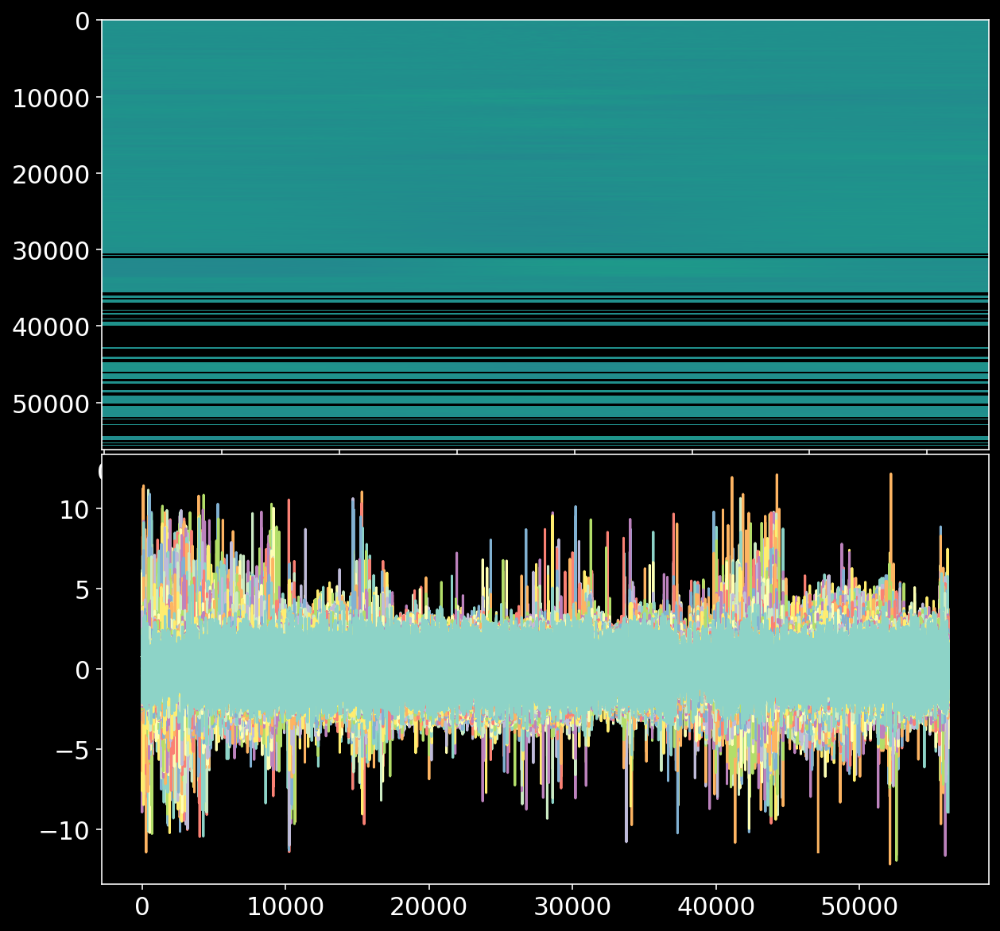

In [11]:
fig, axs = plt.subplots(2,1, figsize=(10, 10), edgecolor='k')
fig.subplots_adjust(hspace = 0.01, wspace=0.5)
axs = axs.ravel()
axs[0].imshow(stats.zscore(ripple_maps,axis=1),aspect="auto")


# axs[1].plot(np.arange(-75,76,1),np.mean(stats.zscore(ripple_maps,axis=1),axis=0))
axs[1].plot(stats.zscore(ripple_maps,axis=1))


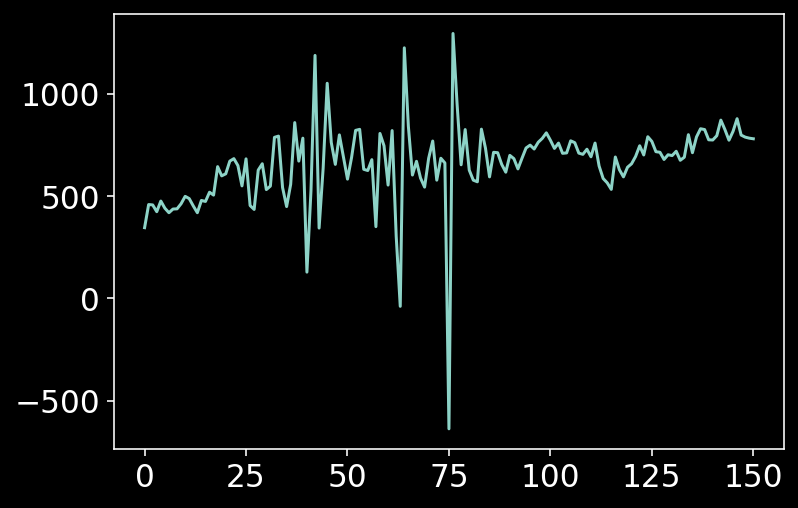

2500 of 56187


KeyboardInterrupt: Interrupted by user

In [12]:
from IPython.display import clear_output
clear_output(wait=True)
value = []
i = 0
for ripple in ripple_maps:
    plt.plot(ripple)
    plt.show()
    print(i, 'of',len(ripple_maps))
    value.append(input("ripple ?:\n"))
    clear_output()
    i+=1

In [69]:
# with open('F:\Projects\PAE_PlaceCell\swr_data\labels\labeled_data_updated.pkl', 'wb') as f:
#     pickle.dump(value, f)
    
# with open(r'F:\Projects\PAE_PlaceCell\swr_data\labels\ripple_maps.pkl', 'wb') as f:
#     pickle.dump(ripple_maps, f)  

In [72]:
ripple_maps_labeled = ripple_maps[0:len(value)]

## plot all labeled ripples

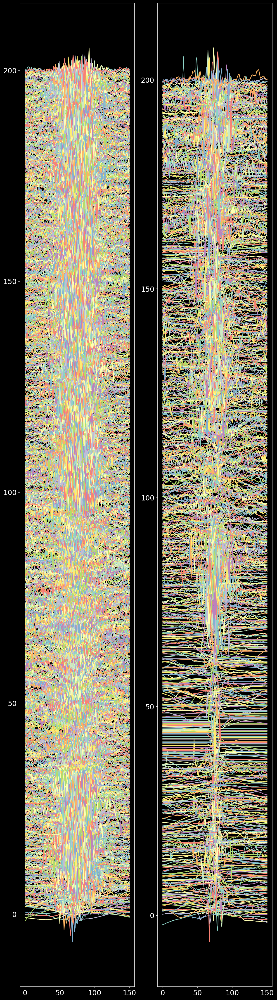

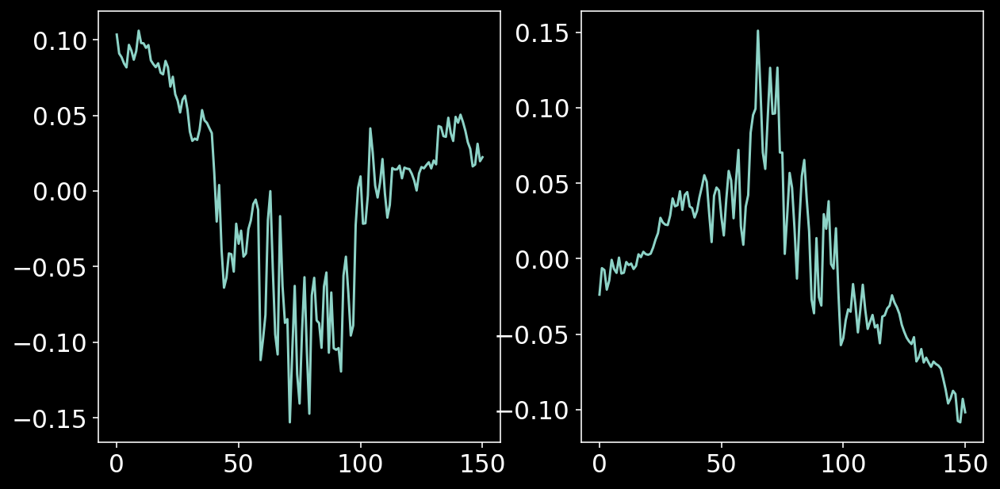

In [86]:
fig, axs = plt.subplots(1,2, figsize=(10, 40), edgecolor='k')

add_ = np.linspace(0,200,sum(np.array(value) == '1'))
axs[0].plot(stats.zscore(ripple_maps_labeled,axis=1)[np.array(value) == '1'].T + add_)

add_ = np.linspace(0,200,sum(np.array(value) == '0'))
axs[1].plot(stats.zscore(ripple_maps_labeled,axis=1)[np.array(value) == '0'].T + add_)
plt.show()


fig, axs = plt.subplots(1,2, figsize=(10, 5), edgecolor='k')

axs[0].plot(np.mean(stats.zscore(ripple_maps_labeled,axis=1)[np.array(value) == '1'].T,axis=1))

axs[1].plot(np.mean(stats.zscore(ripple_maps_labeled,axis=1)[np.array(value) == '0'].T,axis=1))
plt.show()

## plot wavelets behind ripples

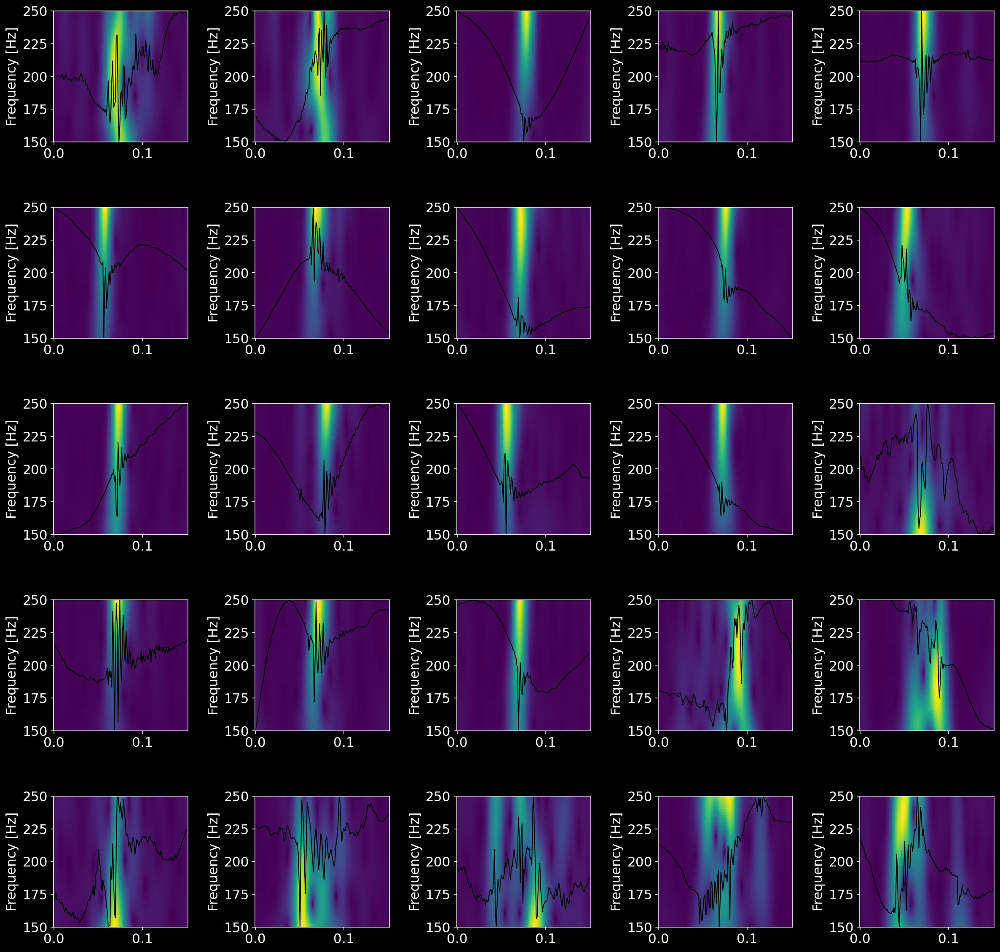

In [314]:
maps = ripple_maps_labeled[np.array(value) == '1',:]

r = np.random.randint(0,len(maps),25)

fig, axs = plt.subplots(5,5, figsize=(20, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.5)
axs = axs.ravel()
for i in range(25):
    get_scalogram(maps[i,:],1000,ax=axs[i])


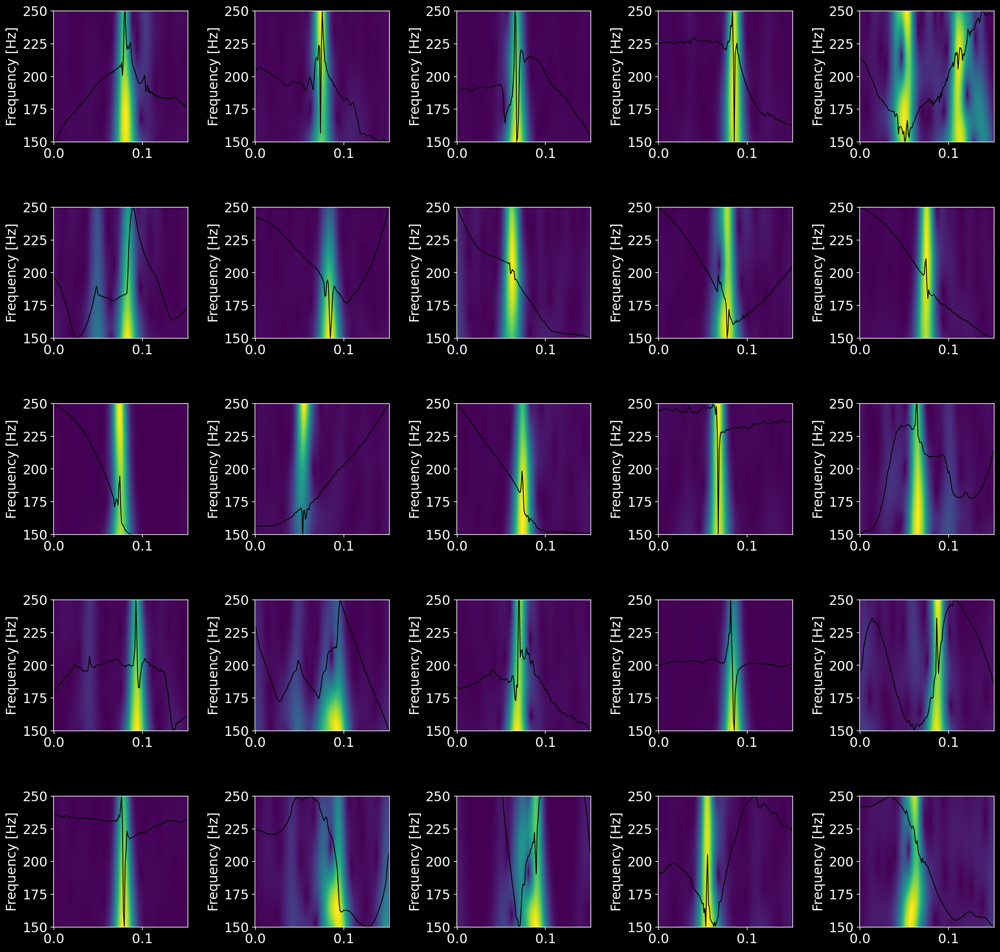

In [315]:
# false positives
maps = ripple_maps_labeled[np.array(value) == '0',:]

r = np.random.randint(0,len(maps),25)

fig, axs = plt.subplots(5,5, figsize=(20, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.5)
axs = axs.ravel()
for i in range(25):
    get_scalogram(maps[i,:],1000,ax=axs[i])

In [100]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

X = stats.zscore(ripple_maps_labeled,axis=1)
y = np.array(value)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.25, random_state=42)

print(len(y_train))
print(len(y_test))
print(len(y_val))

1500
500
500


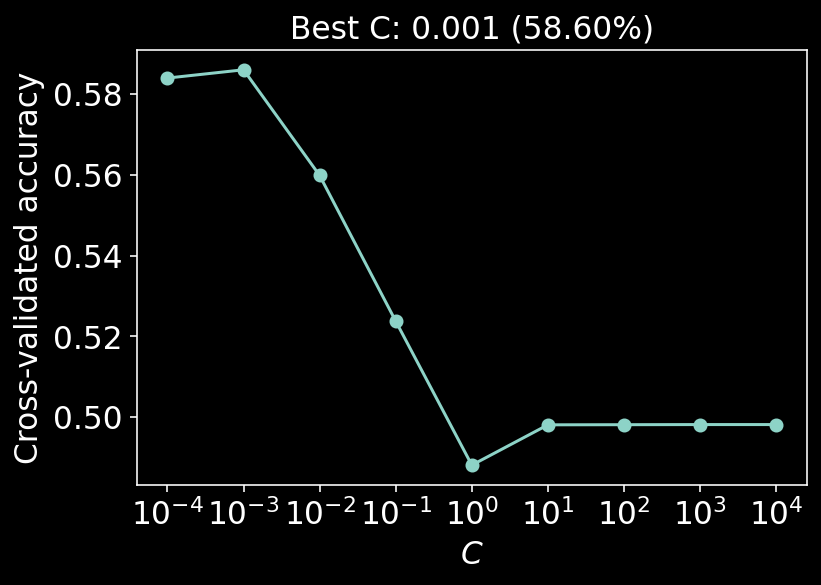

In [110]:
def model_selection(X, y, C_values):
  """Compute CV accuracy for each C value.

  Args:
    X (2D array): Data matrix
    y (1D array): Label vector
    C_values (1D array): Array of hyperparameter values

  Returns:
    accuracies (1D array): CV accuracy with each value of C

  """
  #############################################################################
  # TODO Complete the function and remove the error
  # raise NotImplementedError("Implement the model_selection function")
  #############################################################################

  accuracies = []
  for C in C_values:

    # Initialize and fit the model
    # (Hint, you may need to set max_iter)
    model = LogisticRegression(penalty="l2", C=C, max_iter=5000)

    # Get the accuracy for each test split
    accs = cross_val_score(model, X, y, cv=8)

    # Store the average test accuracy for this value of C
    accuracies.append(accs.mean())

  return accuracies

def plot_model_selection(C_values, accuracies):
  """Plot the accuracy curve over log-spaced C values."""
  ax = plt.figure().subplots()
  ax.set_xscale("log")
  ax.plot(C_values, accuracies, marker="o")
  best_C = C_values[np.argmax(accuracies)]
  ax.set(
      xticks=C_values,
      xlabel="$C$",
      ylabel="Cross-validated accuracy",
      title=f"Best C: {best_C:1g} ({np.max(accuracies):.2%})",
  )
    
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Uncomment and run when the function is ready to test
accuracies = model_selection(X_val, y_val, C_values)
plot_model_selection(C_values, accuracies)

In [111]:


model = LogisticRegression(penalty="l2", C=0.001).fit(X_train, y_train)

# model = LogisticRegression(random_state=0).fit(X_train, y_train)
# print(model.classes_)
# print(model.predict_proba(X_test))
# print(model.predict(X_test))
# print(model.score(X_test, y_test))

model.score(X_test, y_test)

accs = cross_val_score(model, X_test, y_test, cv=8)
print(accs)


[0.61904762 0.65079365 0.6031746  0.65079365 0.64516129 0.62903226
 0.64516129 0.58064516]


In [ ]:
def plot_weights(models, sharey=True):
  """Draw a stem plot of weights for each model in models dict."""
  n = len(models)
  f = plt.figure(figsize=(10, 2.5 * n))
  axs = f.subplots(n, sharex=True, sharey=sharey)
  axs = np.atleast_1d(axs)

  for ax, (title, model) in zip(axs, models.items()):

    ax.margins(x=.02)
    stem = ax.stem(model.coef_.squeeze(), use_line_collection=True)
    stem[0].set_marker(".")
    stem[0].set_color(".2")
    stem[1].set_linewidths(.5)
    stem[1].set_color(".2")
    stem[2].set_visible(False)
    ax.axhline(0, color="C3", lw=3)
    ax.set(ylabel="Weight", title=title)
  ax.set(xlabel="Neuron (a.k.a. feature)")
  f.tight_layout()

In [ ]:
log_reg_l2 = LogisticRegression(penalty="l2", C=1).fit(X, y)

plot_weights({"regularization": log_reg_l2})

In [ ]:
log_reg_l1 = LogisticRegression(penalty="l1", C=1, solver="saga", max_iter=5000)
log_reg_l1.fit(X, y)
plot_weights({"regularization": log_reg_l1})

In [ ]:
f, ax = plt.subplots(figsize=(20,10))
ax.plot(ts, lfp[:,0])
for ripple in ripple_times.itertuples():
    ax.axvspan(ripple.start_time, ripple.end_time, alpha=0.3, color='red', zorder=1000)

## plot some examples

In [ ]:
# pick random ripples to plot
r = np.random.randint(0,len(ripple_times),25)

fig, axs = plt.subplots(5,5, figsize=(20, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.5)
axs = axs.ravel()
for i in range(25):
    idx = np.logical_and(ts >= ripple_times.iloc[r[i]].start_time_extended, ts <= ripple_times.iloc[r[i]].end_time_extended)
    axs[i].plot(ts[idx],lfp[idx,int(ripple_times.iloc[r[i]].peak_channel)],linewidth=1)
    axs[i].axis('off') 
#     axs[i].set_title('duration %s' % float('%.2g' % ripple_times.iloc[r[i]].ripple_duration))
    axs[i].set_title('peak_freq %s' % float('%.2g' % ripple_times.iloc[r[i]].peak_freq))

fig, axs = plt.subplots(5,5, figsize=(20, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.5)
axs = axs.ravel()        
for i in range(25):
    idx = np.logical_and(ts >= ripple_times.iloc[r[i]].start_time_extended, ts <= ripple_times.iloc[r[i]].end_time_extended)
    axs[i].plot(ts[idx],filtered_lfps[idx,int(ripple_times.iloc[r[i]].peak_channel)],linewidth=1)
    axs[i].axis('off')      

In [ ]:
plt.hist(ripple_times.peak_freq)

In [ ]:
r = np.random.randint(0,len(ripple_times),25)

fig, axs = plt.subplots(5,5, figsize=(20, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.5)

axs = axs.ravel()

# for i in range(25):
#   idx = np.logical_and(ts >= ripple_times.iloc[r[i]].start_time_extended, ts <= ripple_times.iloc[r[i]].end_time_extended)
#   for j in range(channels):
#       axs[i].plot(ts[idx],filtered_lfps[idx,j],linewidth=1)
#       axs[i].axis('off')
        
        
for i in range(25):
    idx = np.logical_and(ts >= ripple_times.iloc[r[i]].start_time_extended, ts <= ripple_times.iloc[r[i]].end_time_extended)
    axs[i].plot(ts[idx],filtered_lfps[idx,int(ripple_times.iloc[r[i]].peak_channel)],linewidth=1)
    axs[i].axis('off')         